# Covid19 - Brazil (Cities) Basic Geographic Analysis
- by Marcelo Rovai
- 27 April 2020

## Main Libraries and setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly
import plotly.graph_objs as go
import geopandas as gpd
from shapely.geometry import Point, Polygon
from unicodedata import normalize
from PIL import Image
import imageio

In [2]:
from cv_util_func import *

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
pd.options.display.float_format = '{:,}'.format
mpl.rcParams['figure.dpi']= 150
plt.style.use('seaborn-paper')

## Datasets

### Worldometers Daily Data

- Based on TDS article: [Track Coronavirus in Your Country by Displaying Notifications Using Python](https://towardsdatascience.com/coronavirus-track-coronavirus-in-your-country-by-displaying-notification-c914b5652088)

In [5]:
worldmetersLink = "https://www.worldometers.info/coronavirus/"

In [14]:
_, _ = get_wordometers_covid('WW', worldmetersLink)
_, _ = get_wordometers_covid('USA', worldmetersLink)
_, _ = get_wordometers_covid('India', worldmetersLink)
_, _ = get_wordometers_covid('Russia', worldmetersLink)
_, _ = get_wordometers_covid('Chile', worldmetersLink)
_, _ = get_wordometers_covid('Mexico', worldmetersLink)


WW - Worldometers Daily Data

Today is 2020-04-27 17:21:59.896657 
- Total infected = North America 
- New Cases = 1.085.122 
- Total Deaths = 20.519 
- New Deaths = 61.274 
- Recovered = 1.319 
- Active Cases = 167.034 
- Serious-Critical = 856.814

USA - Worldometers Daily Data

Today is 2020-04-27 17:22:02.459196 
- Total infected = 1.004.942 
- New Cases = 17.782 
- Total Deaths = 56.527 
- New Deaths = 1.114 
- Recovered = 137.591 
- Active Cases = 810.824 
- Serious-Critical = 14.175

India - Worldometers Daily Data

Today is 2020-04-27 17:22:04.832568 
- Total infected = 29.451 
- New Cases = 1.561 
- Total Deaths = 939 
- New Deaths = 58 
- Recovered = 7.137 
- Active Cases = 21.375 
- Serious-Critical = 0

Russia - Worldometers Daily Data

Today is 2020-04-27 17:22:06.804991 
- Total infected = 87.147 
- New Cases = 6.198 
- Total Deaths = 794 
- New Deaths = 47 
- Recovered = 7.346 
- Active Cases = 79.007 
- Serious-Critical = 2.300

Chile - Worldometers Daily Data

Today i

In [6]:
data_wd_covid_br, today = get_wordometers_covid('Brazil', worldmetersLink)
# Saving Brazil info
Total_infected = data_wd_covid_br[0]
New_Cases = data_wd_covid_br[1]
Total_Deaths = data_wd_covid_br[2]
New_Deaths = data_wd_covid_br[3] 
Recovred = data_wd_covid_br[4] 
Active_Case = data_wd_covid_br[5] 
Serious_Critical = data_wd_covid_br[6]
date = today


Brazil - Worldometers Daily Data

Today is 2020-04-27 16:56:59.942178 
- Total infected = 66.501 
- New Cases = 3.642 
- Total Deaths = 4.543 
- New Deaths = 272 
- Recovered = 31.142 
- Active Cases = 30.816 
- Serious-Critical = 8.318


### Covid19

Confirmed cases by day, using information from the news. Covid19br dataset is available at GitHub https://github.com/wcota/covid19br, with data by city compiled from original dataset provided by [Brasil.IO](https://brasil.io/dataset/covid19/caso/). <br>
Thanks to: 
- [Wesley Cota](https://wesleycota.com), PhD candidate - Complex Networks/Physics (Universidade Federal de Viçosa - Brazil and Universidad de Zaragoza - Spain) 
- [Alvaro Justen](https://blog.brasil.io/author/alvaro-justen.html) from [Brasil.IO](https://brasil.io/dataset/covid19/caso/).

License: [Creative Commons Attribution-ShareAlike 4.0 International (CC BY-SA 4.0)](https://creativecommons.org/licenses/by-sa/4.0/)

More information: https://wcota.me/covid19br and [ESPECIAL COVID-19 - Dados por Município](https://brasil.io/covid19/)

**Number of total cases by city** 

In [7]:
dt, dt_tm, dt_tm_city, dt_state, total_cases, deaths, cfr = get_brazil_cv_data(
    date)


Today is 2020/4/27. Dataset with 1864 observations.


Total number of cases in Brasil at 4/27: 66,846 (4543 fatal) with a CFR of 6.8%


**Total cases by state**

In [8]:
dt_state.sort_values('deaths', ascending=False)

,state,deaths,totalCases,CFR[%]
25,SP,1825,21696,8.41
18,RJ,677,7944,8.52
15,PE,450,5358,8.4
5,CE,390,6783,5.75
2,AM,320,3928,8.15
9,MA,125,2410,5.19
13,PA,114,2128,5.36
4,BA,76,2365,3.21
17,PR,75,1186,6.32
10,MG,62,1586,3.91


**Timeline Brazil**

In [9]:
plot_cases(dt_tm, 'TOTAL', y_scale='linear', n_0=1_000, mov=3, show=True, save=True)
plot_cases(dt_tm, 'TOTAL', y_scale='log', n_0=1_000, mov=3, show=True, save=True)

**Timeline of cases per city**

In [10]:
top_cities = list(dt.sort_values('totalCases', ascending=False)[:10].city)
top_cities

['São Paulo/SP',
 'Fortaleza/CE',
 'Rio de Janeiro/RJ',
 'Manaus/AM',
 'CASO SEM LOCALIZAÇÃO DEFINIDA/PE',
 'São Luís/MA',
 'Recife/PE',
 'Salvador/BA',
 'Brasília/DF',
 'Belém/PA']

In [11]:
for city in top_cities:
    plot_cases(dt_tm, city, y_scale='linear', n_0=100)
    plot_cases(dt_tm, city, y_scale='log', n_0=100) 

In [12]:
plot_cases(dt_tm, 'São Paulo/SP', y_scale='linear', n_0=1000, mov=5, show=True, save=False)
plot_cases(dt_tm, 'São Paulo/SP', n_0=1000, mov=5, show=True, save=False)

In [13]:
plot_cases(dt_tm, 'Manaus/AM', y_scale='linear', n_0=100, mov=5, show=True, save=False)
plot_cases(dt_tm, 'Manaus/AM', y_scale='log', n_0=100, mov=5, show=True, save=False)

### GeoData (Brasil & Municipalities)

In [8]:
br_shp, br_cities = load_geodata()

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)
Average Demografic Density : 23.0 hab/km2 (aprox.)


## Maping CoronaVirus data

### Nationwide Analysis

In [9]:
date = datetime.datetime.today()
cv_city, deaths_city, cv_city_pnt, deaths_city_pnt, total_cases, deaths, cfr = get_Brazil_data(dt, br_shp, br_cities)

Brazil: Total number of Covid19 cases at 4/26: 62,373 (4,206 fatal) in 1,769 cities with a CFR of 6.74%


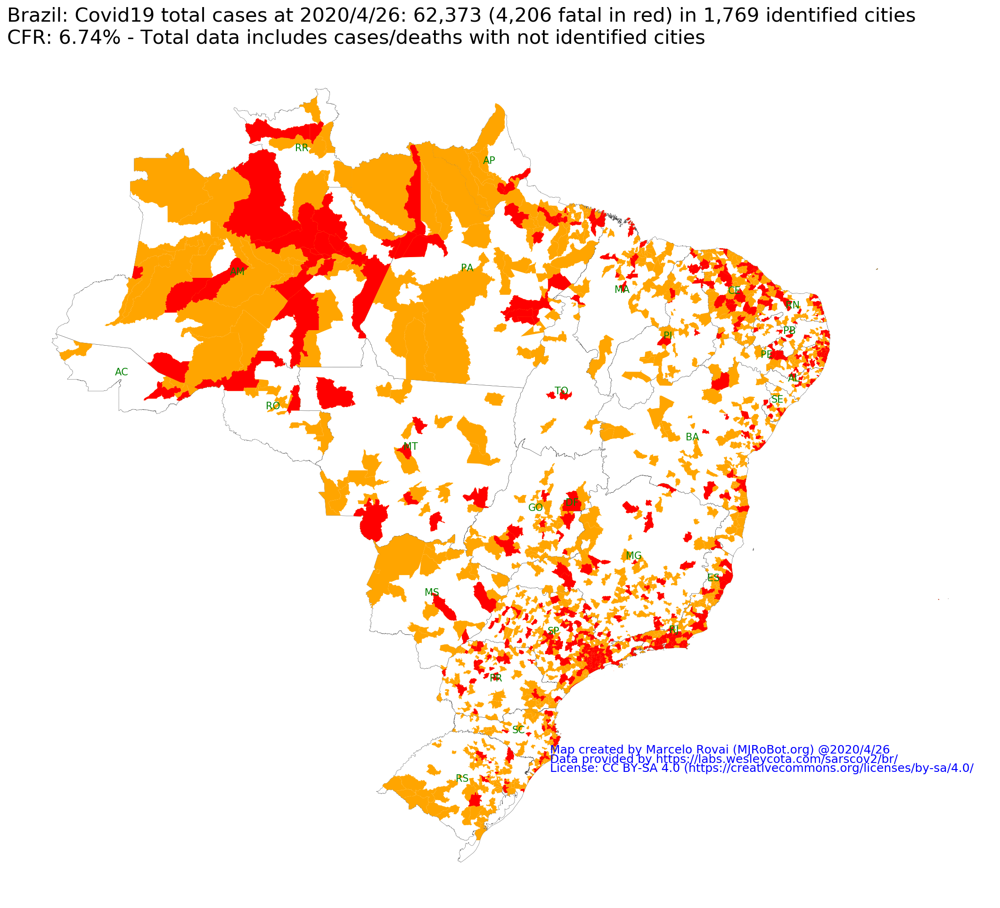

In [16]:
plt_Brasil_cities(cv_city, deaths_city, date, total_cases, deaths, cfr, br_shp, br_cities, deaths_only=False)

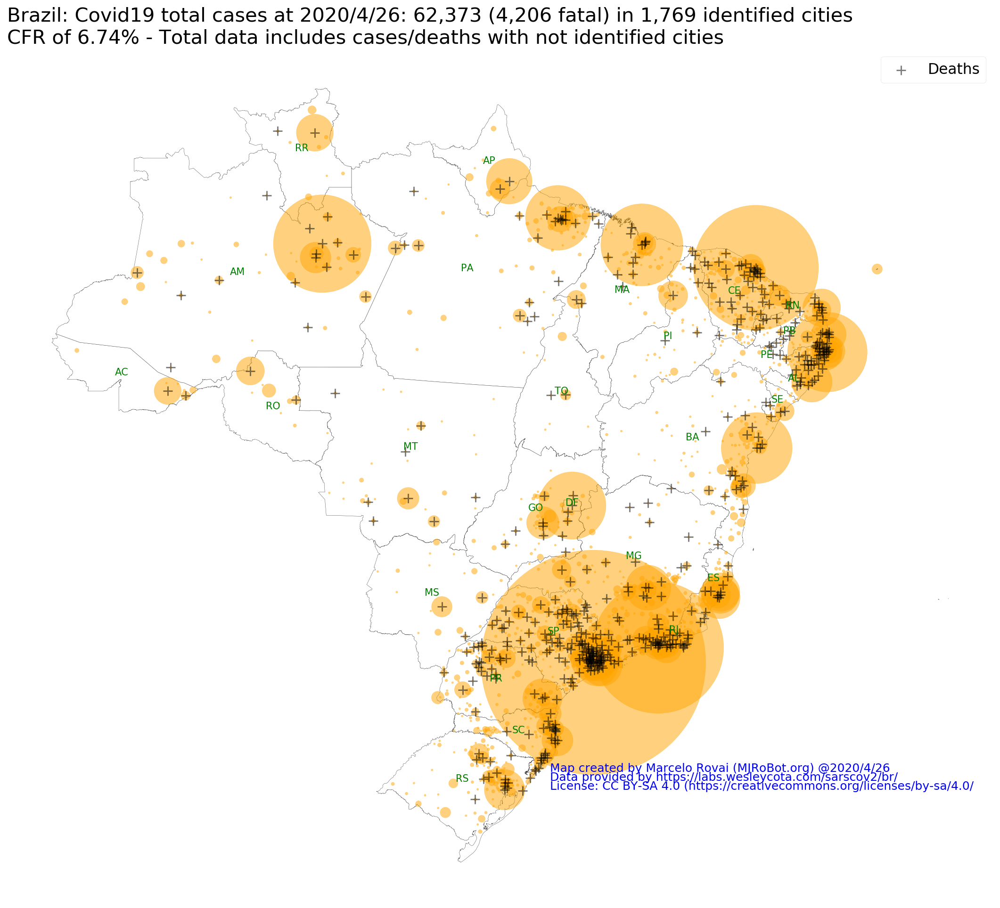

In [17]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, cfr, br_shp, br_cities)

**WARNING** 

Position of annotation in final saved figures is different from the ones showed at Notebook

## Other Pandemic metrics maps

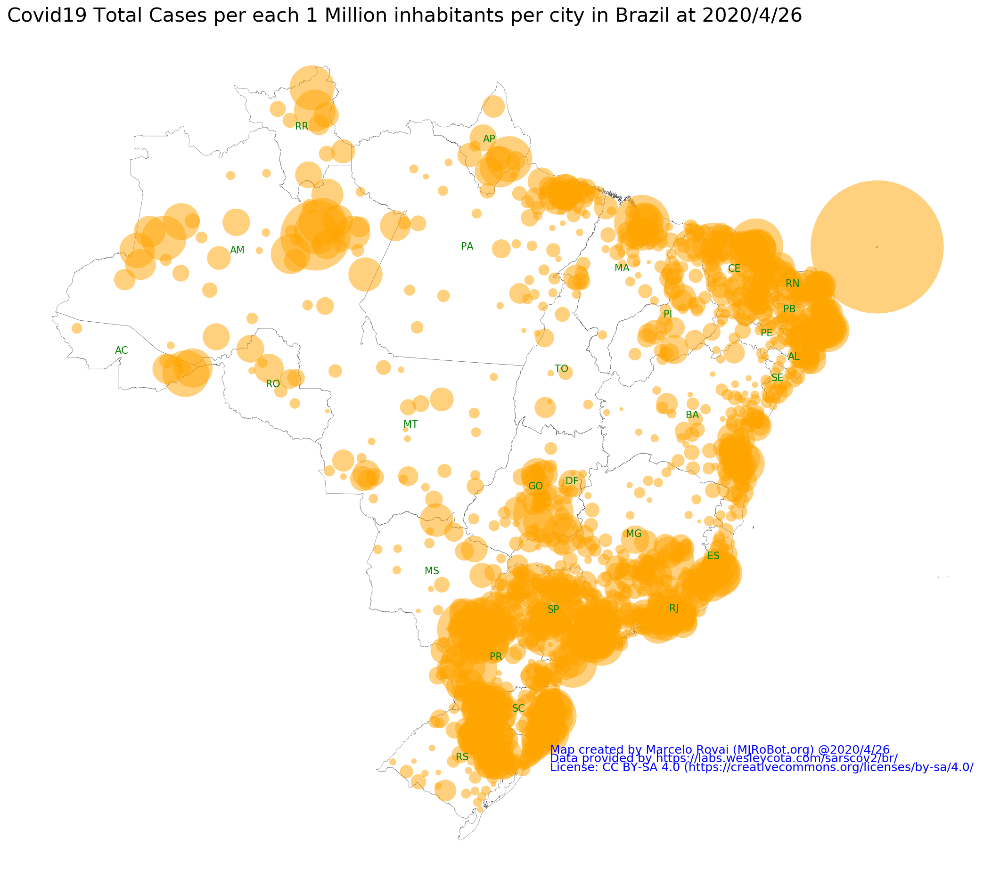

In [18]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, cfr, br_shp, br_cities, metrics='TotalCases/1M pop', n=2 )

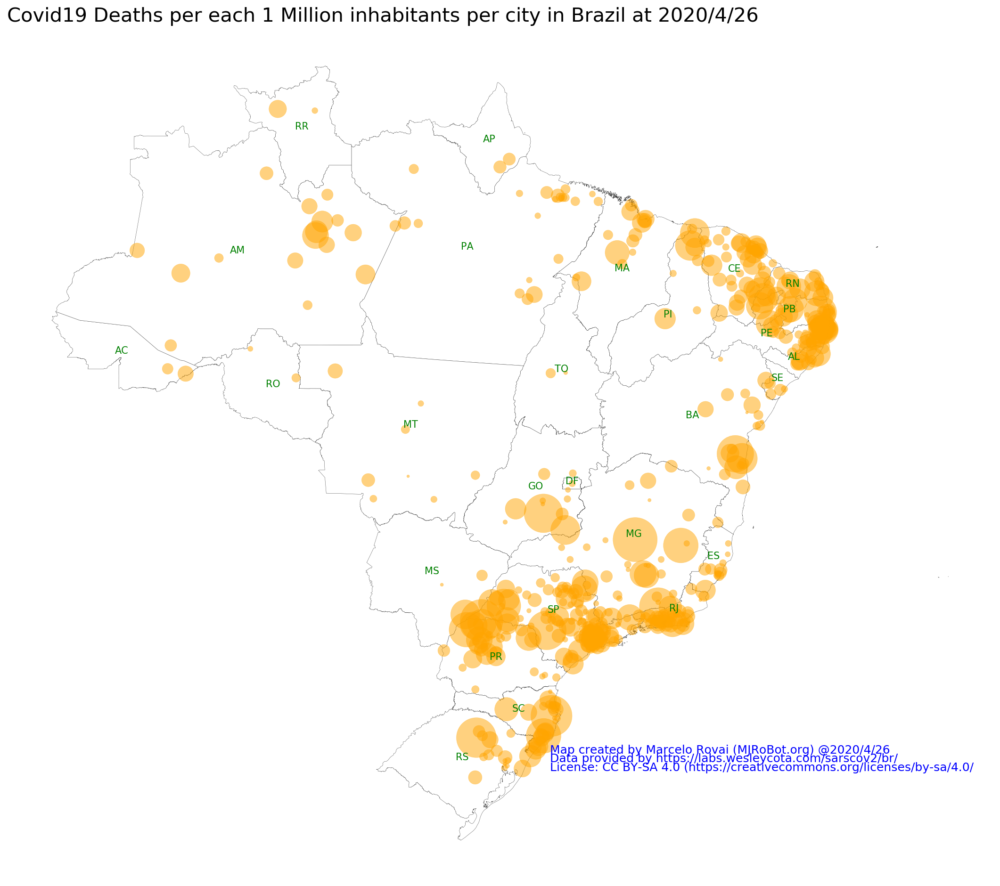

In [19]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, cfr, br_shp, br_cities, metrics='Deaths/1M pop', n=5 )

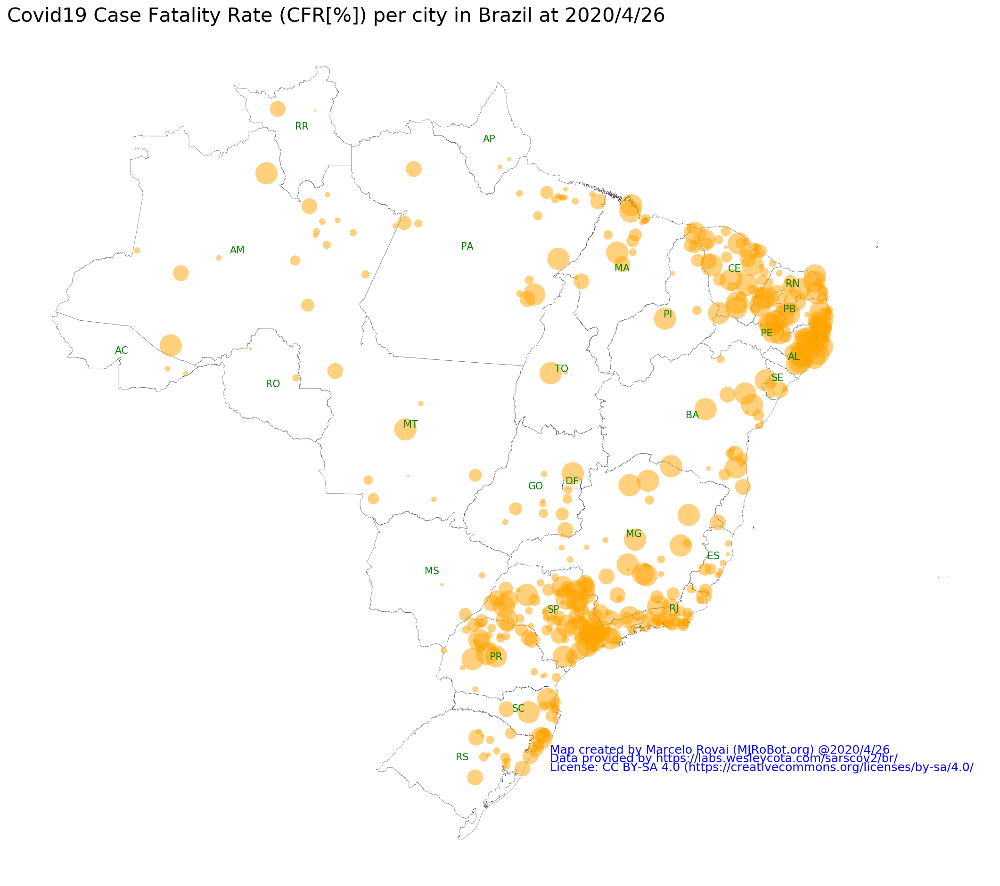

In [20]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, cfr, br_shp, br_cities, metrics='CFR[%]', n=5 )

### Selected State Analysis

Total number of Covid19 cases reported in SP State at 4/26: 20,715 (1,700 fatal) in 285 specified cities


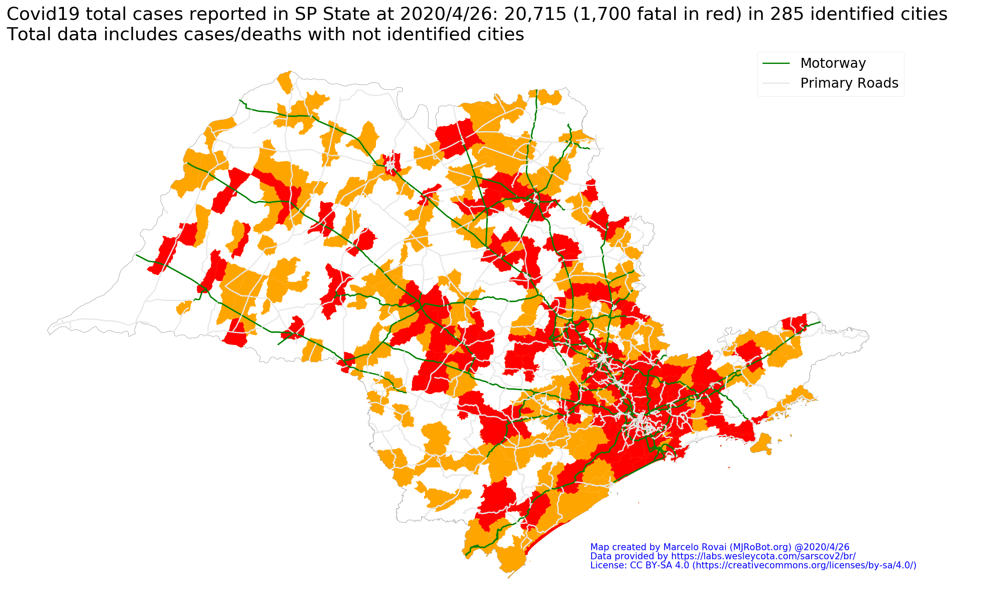

In [21]:
cv_sp, deaths_sp, sp_total_cases, sp_deaths = get_state_info(cv_city, dt_state, br_shp, br_cities, 'SP')

Total number of Covid19 cases reported in RJ State at 4/26: 7,111 (645 fatal) in 75 specified cities
Total number of Covid19 cases reported in MG State at 4/26: 1,548 (61 fatal) in 157 specified cities
Total number of Covid19 cases reported in CE State at 4/26: 6,086 (327 fatal) in 126 specified cities


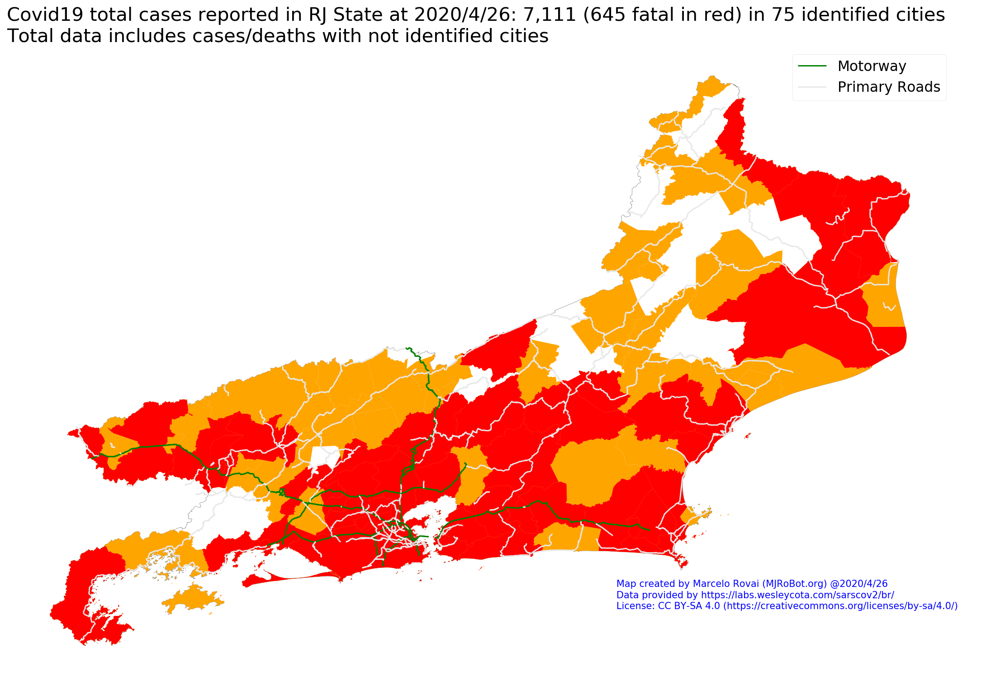

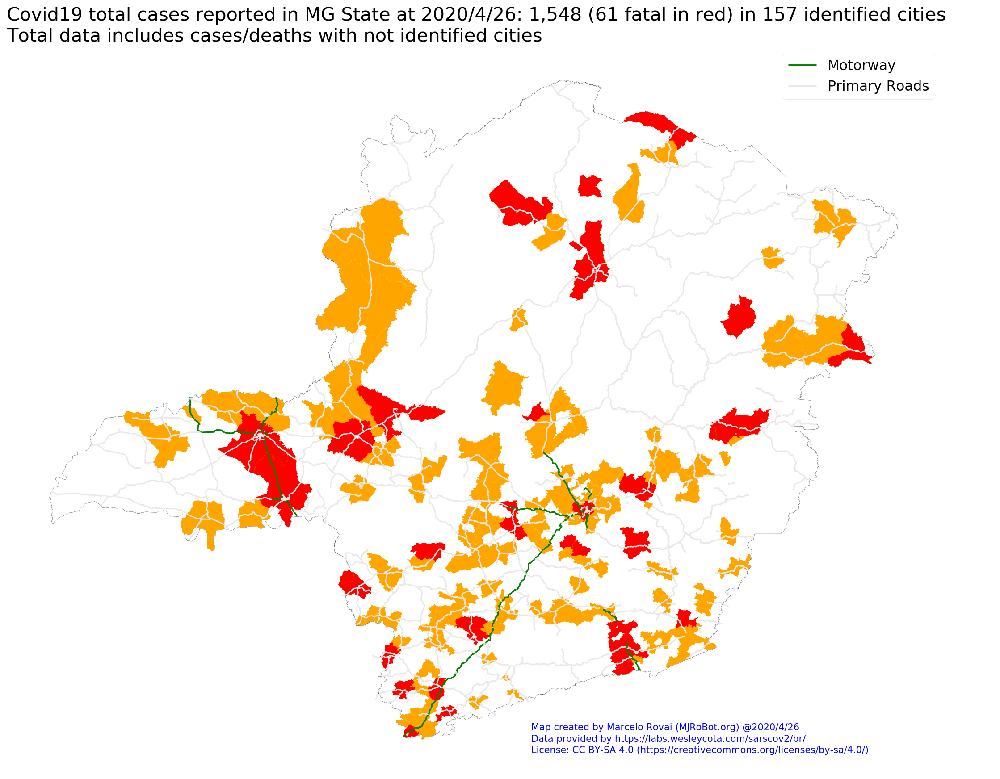

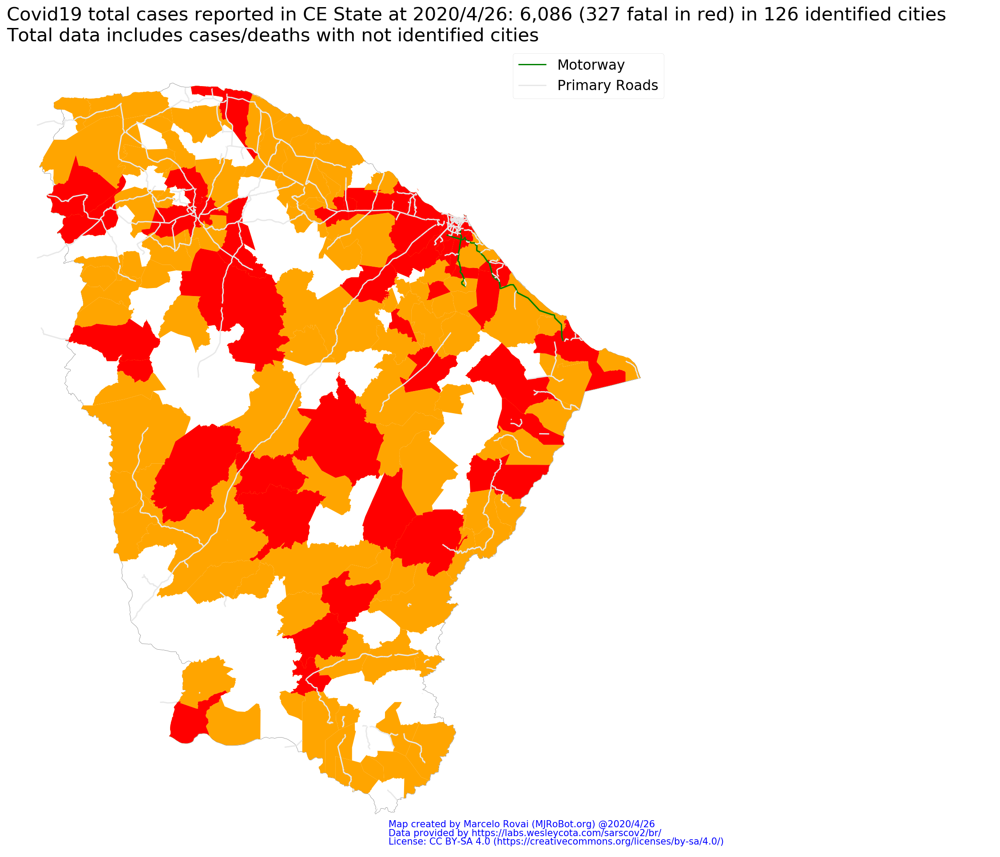

In [22]:
cv_rj, deaths_rj, rj_total_cases, rj_deaths = get_state_info(cv_city, dt_state, br_shp, br_cities, 'RJ')
cv_mg, deaths_mg, mg_total_cases, mg_deaths = get_state_info(cv_city, dt_state, br_shp, br_cities, 'MG')
cv_ce, deaths_ce, ce_total_cases, ce_deaths = get_state_info(cv_city, dt_state, br_shp, br_cities, 'CE')

## Creating  Gifs / Movies 

### Creating Gifs
 - https://github.com/imageio/imageio

In [10]:
cv_city_t = pd.merge(br_cities, dt_tm_city, on='COD. IBGE')
deaths_city_t = cv_city_t.loc[cv_city_t['deaths'] != 0].copy()
dates = list(set(cv_city_t.date))
dates.sort()

In [11]:
dates = dates[-2:]

In [12]:
# For updating after first time
dates

['2020-04-25', '2020-04-26']

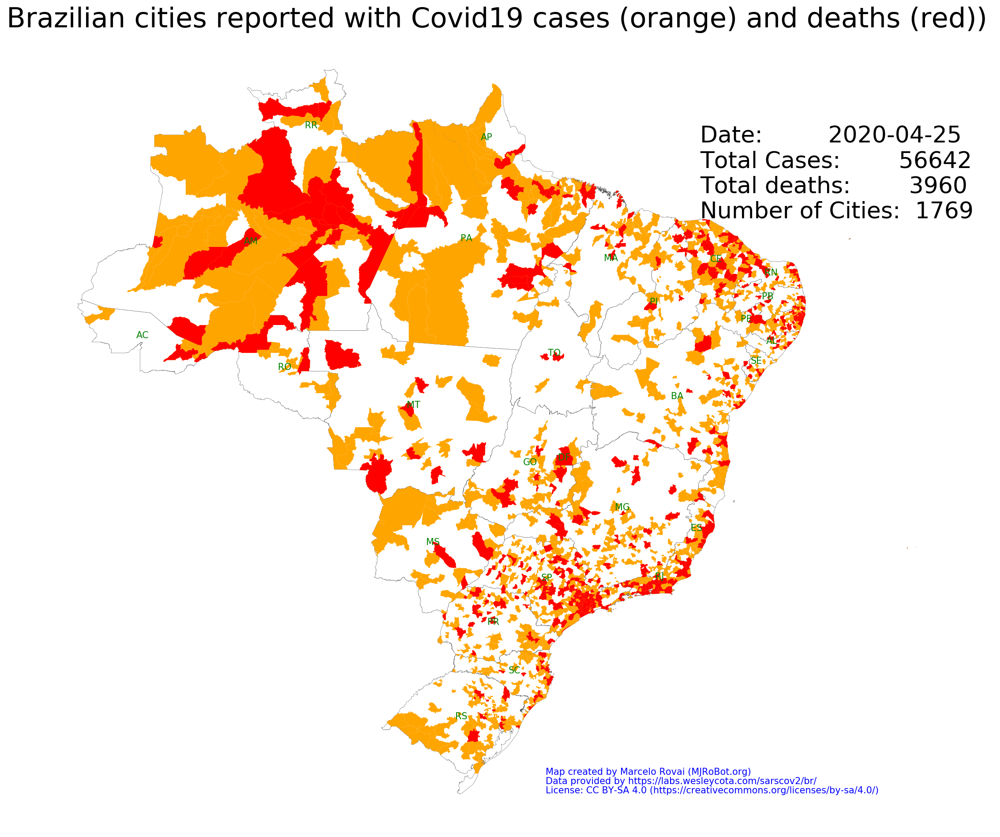

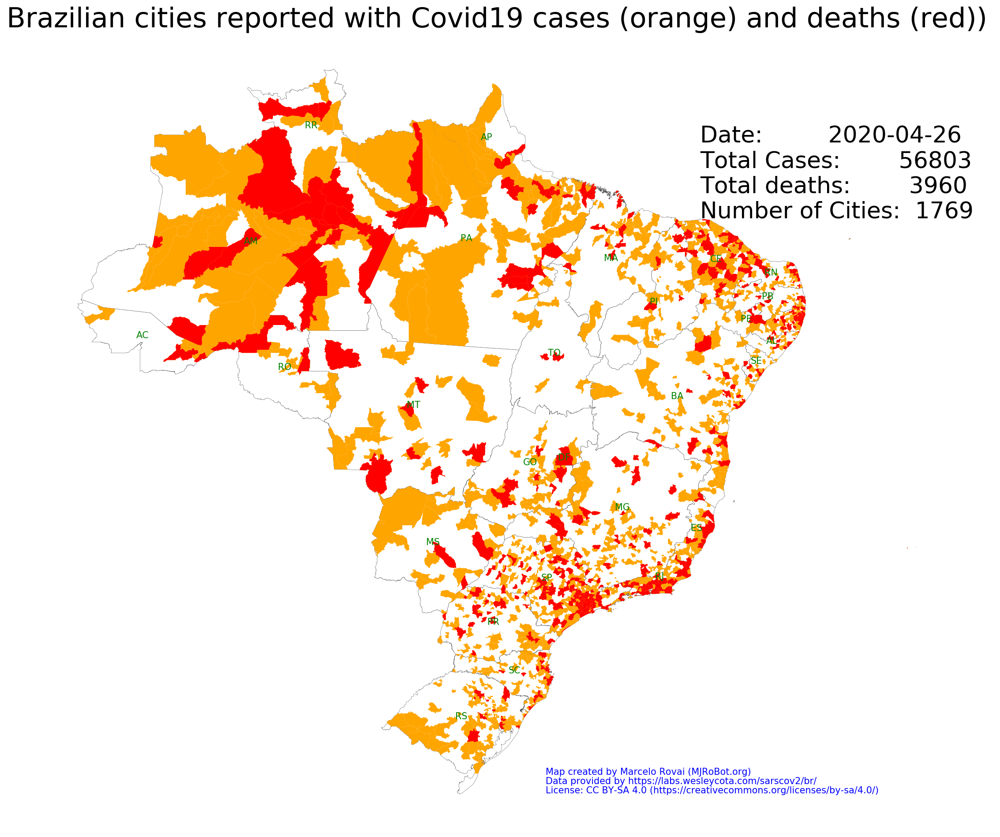

In [13]:
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'BR')

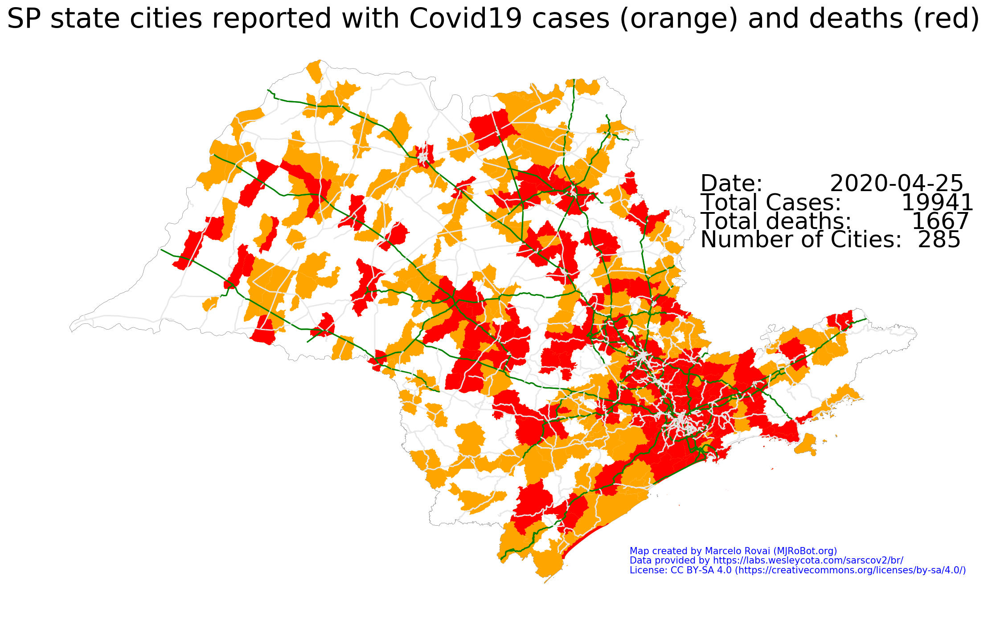

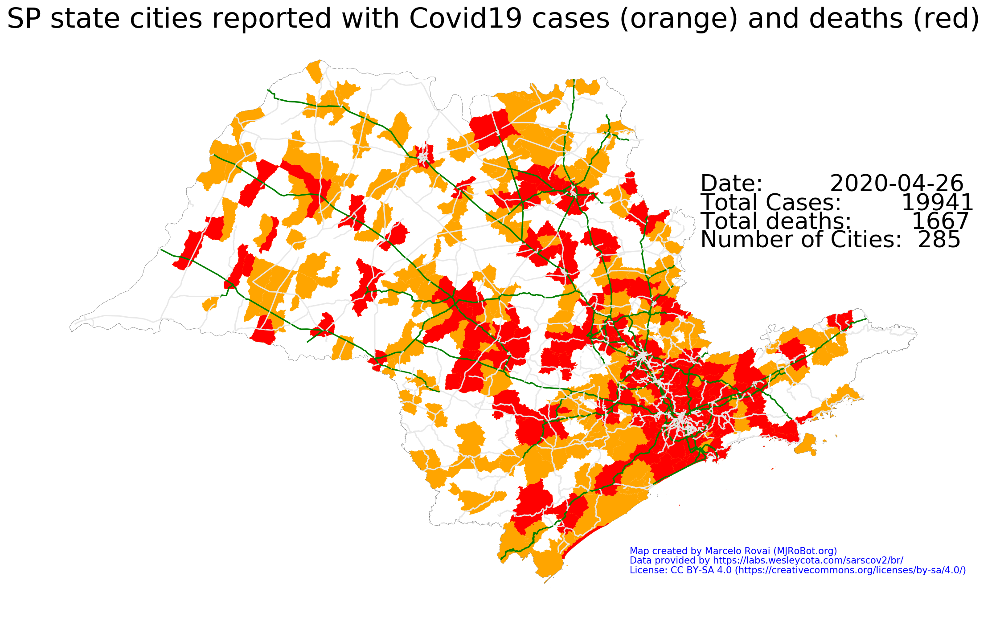

In [13]:
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'SP')

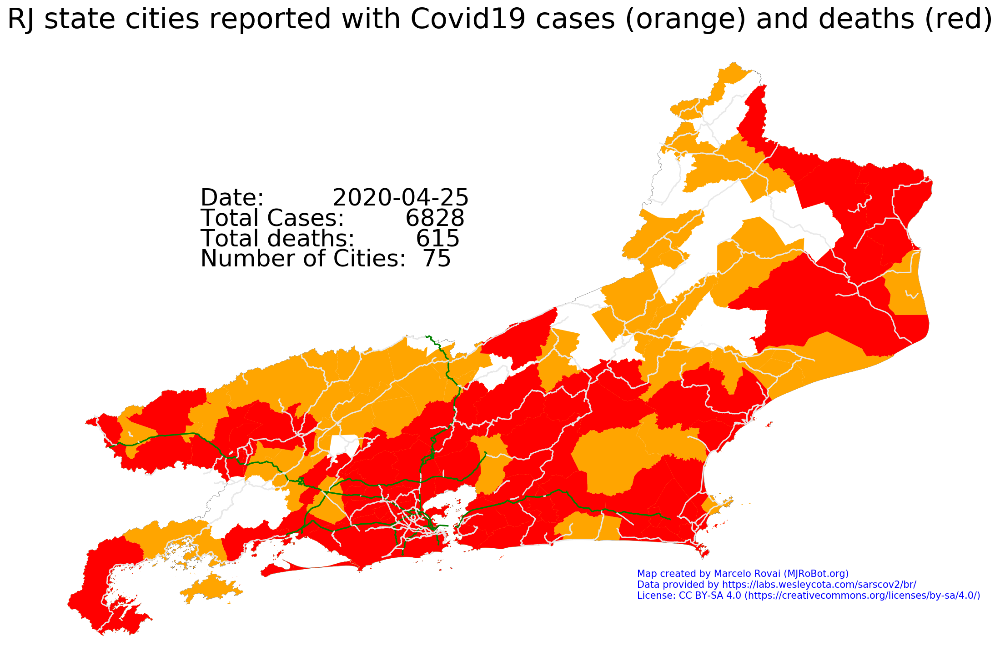

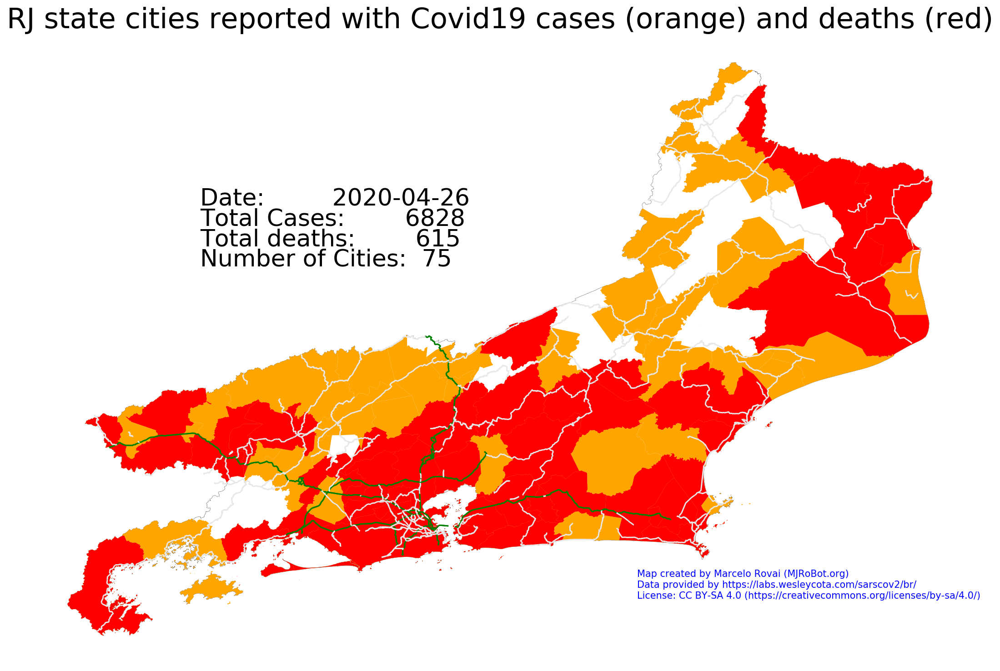

In [14]:
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'RJ')

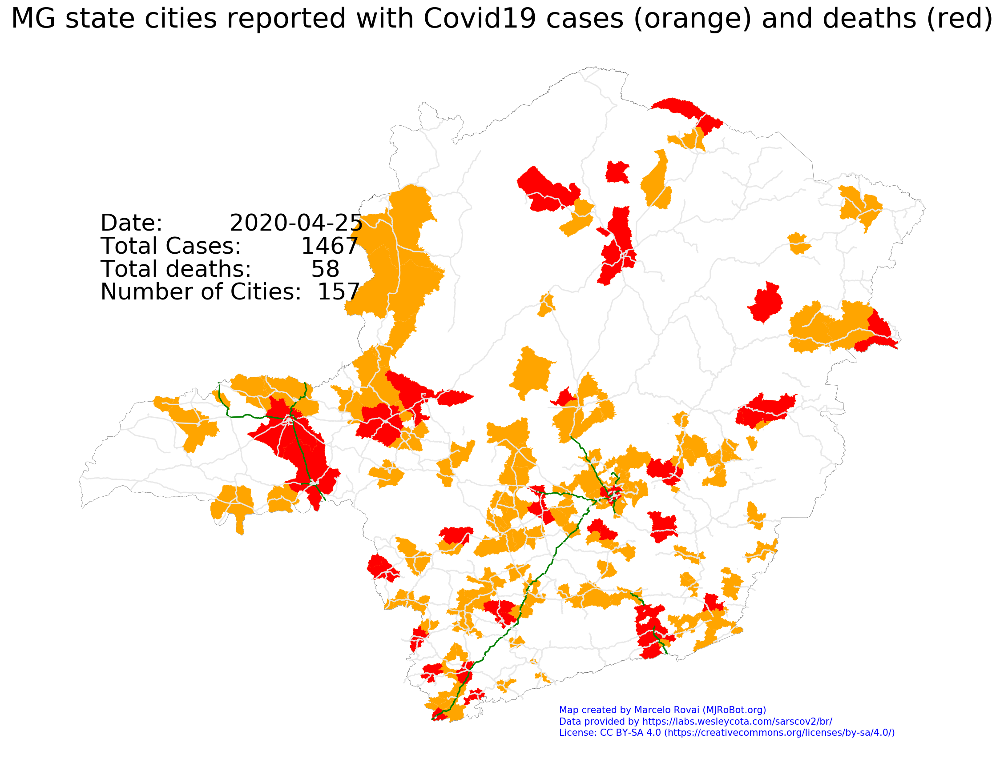

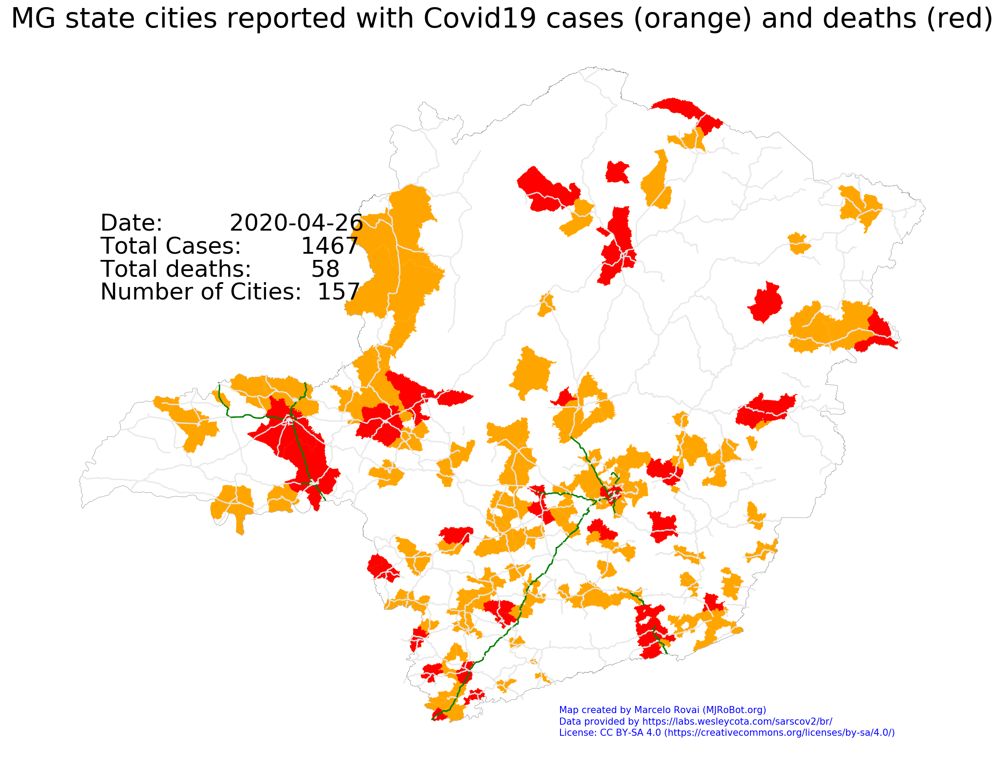

In [15]:
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'MG')

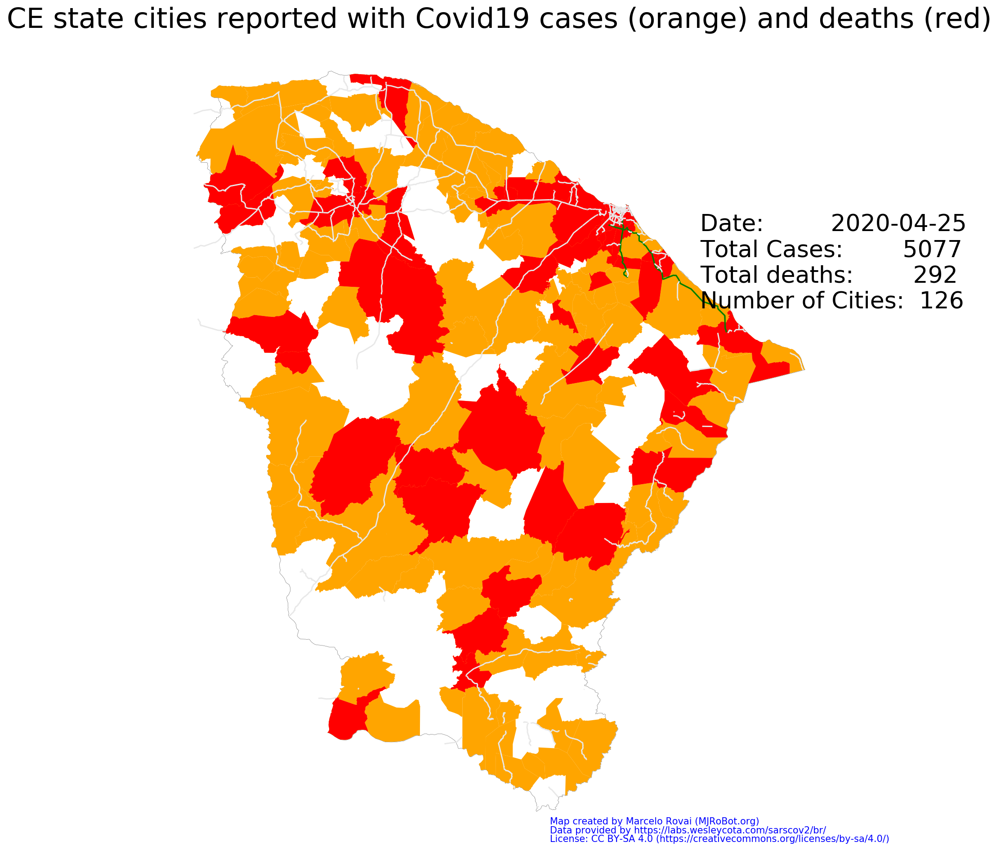

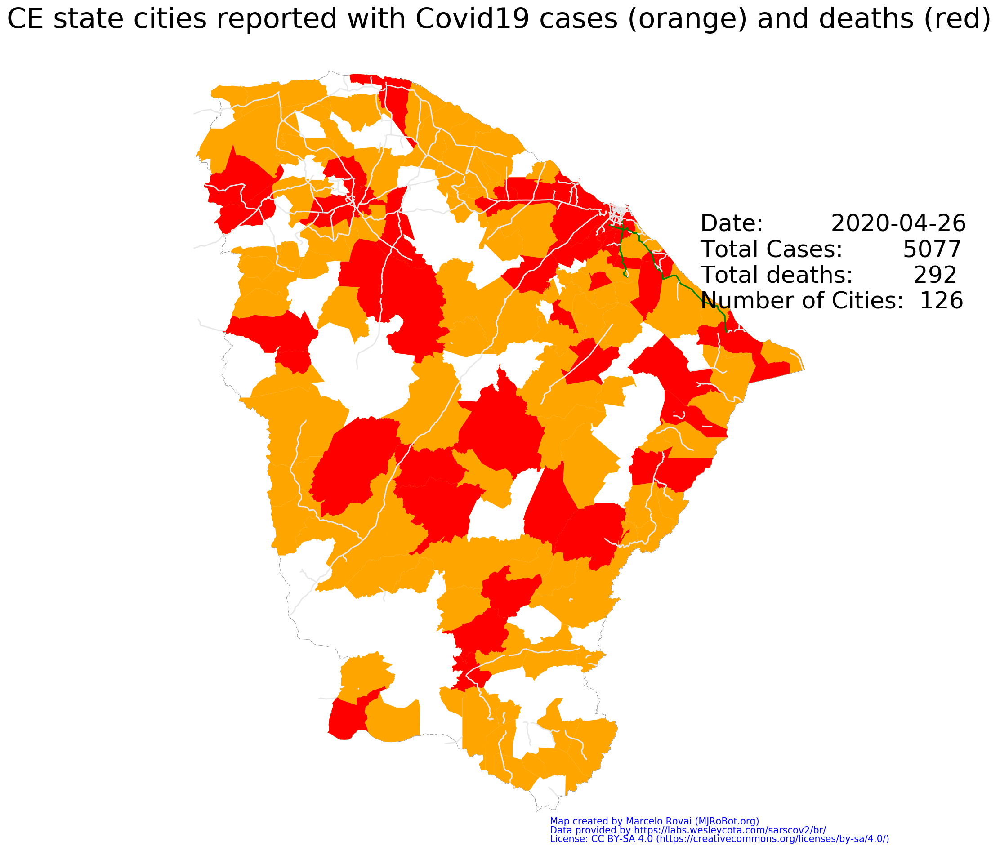

In [16]:
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'CE')

### Creating videos from Gifs

In [10]:
print ('\n[INFO] Creating Movies - WAIT ', end =" ")        
### Creating videos from Gifs

conv_gif_to_mp4('BR', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('SP', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('RJ', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('MG', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('CE', fps=5); print ('.', end =" ") 

print ('\n[INFO] End script MJRoBot.org @ {}\n'.format(today)) 


[INFO] Creating Movies - WAIT  . . . . . 
[INFO] End script MJRoBot.org @ 2020-04-27 13:28:48.934437

